## Business Problem Overview

Business Problem Overview
In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

 

For many incumbent operators, retaining high profitable customers is the number one business goal.

 

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

 

In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

### Understanding the Business Objective and the Data


Understanding the Business Objective and the Data
The dataset contains customer-level information for a span of four consecutive months - June, July, August and September. The months are encoded as 6, 7, 8 and 9, respectively. 


The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do th

### Understanding Customer Behaviour During Churn


Customers usually do not decide to switch to another competitor instantly, but rather over a period of time (this is especially applicable to high-value customers). In churn prediction, we assume that there are three phases of customer lifecycle :

1. The ‘good’ phase: In this phase, the customer is happy with the service and behaves as usual.

2. The ‘action’ phase: The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a  competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. Also, it is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. The ‘churn’ phase: In this phase, the customer is said to have churned. You define churn based on this phase. Also, it is important to note that at the time of prediction (i.e. the action months), this data is not available to you for prediction. Thus, after tagging churn as 1/0 based on this phase, you discard all data corresponding to this phase.

 

In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month is the ‘churn’ phase.

In [430]:
# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score,recall_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

import statsmodels
import statsmodels.api as sm

import warnings
warnings.filterwarnings('ignore')

In [431]:
# importing the data set
data = pd.read_csv("/Users/azharsharieff/Desktop/case_study_telecom_churn/telecom_churn_data (1).csv")

# setting max 
pd.set_option('display.max_columns',500)
pd.set_option('display.max_rows',500)

data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [432]:
# checking number of rows and columns
print(data.shape)
print("\n******************************\n")
data.info(verbose=True)

(99999, 226)

******************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
mobile_number               int64
circle_id                   int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6        object
last_date_of_month_7        object
last_date_of_month_8        object
last_date_of_month_9        object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7               float64
roam_ic_mou_8           

In [433]:
data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

## Exploaratory Data Analysis

### Univariate analysis

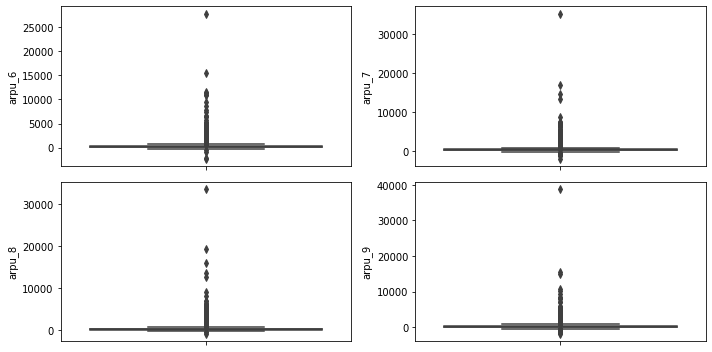

In [434]:
plt.figure(figsize=(10,5))
plt.subplot(221)
sns.boxplot(data['arpu_6'], orient='v')

plt.subplot(222)
sns.boxplot(data['arpu_7'], orient='v')

plt.subplot(223)
sns.boxplot(data['arpu_8'], orient='v')

plt.subplot(224)
sns.boxplot(data['arpu_9'], orient='v')

plt.tight_layout()

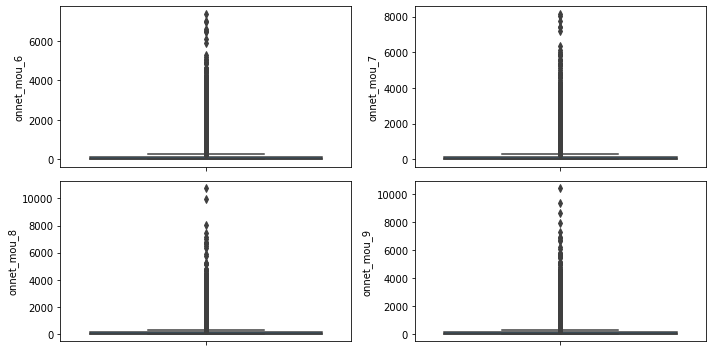

In [435]:
plt.figure(figsize=(10,5))
plt.subplot(221)
sns.boxplot(data['onnet_mou_6'], orient='v')

plt.subplot(222)
sns.boxplot(data['onnet_mou_7'], orient='v')

plt.subplot(223)
sns.boxplot(data['onnet_mou_8'], orient='v')

plt.subplot(224)
sns.boxplot(data['onnet_mou_9'], orient='v')

plt.tight_layout()

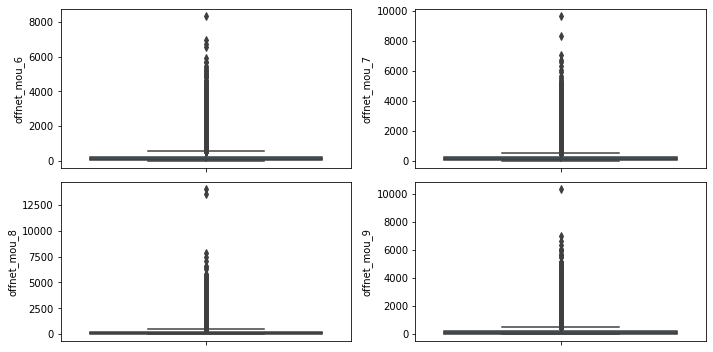

In [436]:
plt.figure(figsize=(10,5))
plt.subplot(221)
sns.boxplot(data['offnet_mou_6'], orient='v')

plt.subplot(222)
sns.boxplot(data['offnet_mou_7'], orient='v')

plt.subplot(223)
sns.boxplot(data['offnet_mou_8'], orient='v')

plt.subplot(224)
sns.boxplot(data['offnet_mou_9'], orient='v')

plt.tight_layout()

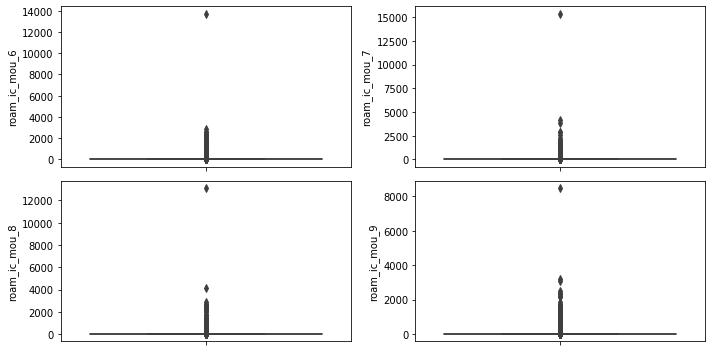

In [437]:
plt.figure(figsize=(10,5))
plt.subplot(221)
sns.boxplot(data['roam_ic_mou_6'], orient='v')

plt.subplot(222)
sns.boxplot(data['roam_ic_mou_7'], orient='v')

plt.subplot(223)
sns.boxplot(data['roam_ic_mou_8'], orient='v')

plt.subplot(224)
sns.boxplot(data['roam_ic_mou_9'], orient='v')

plt.tight_layout()

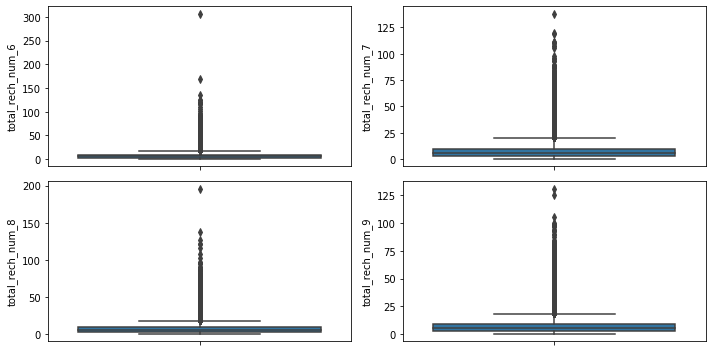

In [438]:
plt.figure(figsize=(10,5))
plt.subplot(221)
sns.boxplot(data['total_rech_num_6'], orient='v')

plt.subplot(222)
sns.boxplot(data['total_rech_num_7'], orient='v')

plt.subplot(223)
sns.boxplot(data['total_rech_num_8'], orient='v')

plt.subplot(224)
sns.boxplot(data['total_rech_num_9'], orient='v')

plt.tight_layout()

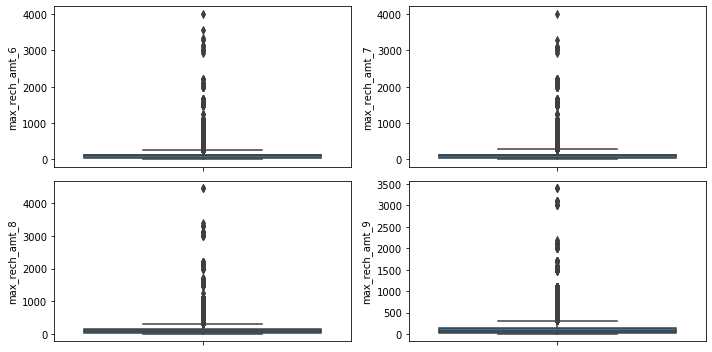

In [439]:
plt.figure(figsize=(10,5))
plt.subplot(221)
sns.boxplot(data['max_rech_amt_6'], orient='v')

plt.subplot(222)
sns.boxplot(data['max_rech_amt_7'], orient='v')

plt.subplot(223)
sns.boxplot(data['max_rech_amt_8'], orient='v')

plt.subplot(224)
sns.boxplot(data['max_rech_amt_9'], orient='v')

plt.tight_layout()

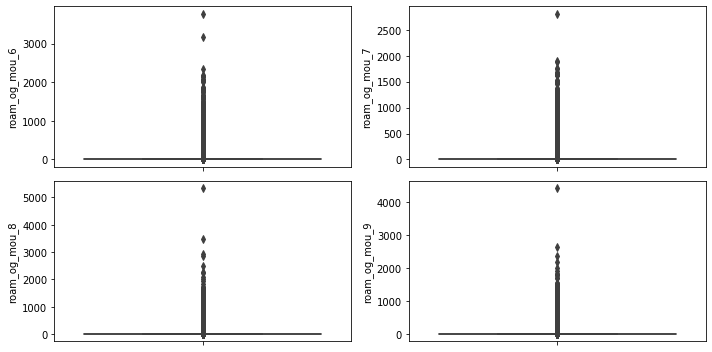

In [440]:
plt.figure(figsize=(10,5))
plt.subplot(221)
sns.boxplot(data['roam_og_mou_6'], orient='v')

plt.subplot(222)
sns.boxplot(data['roam_og_mou_7'], orient='v')

plt.subplot(223)
sns.boxplot(data['roam_og_mou_8'], orient='v')

plt.subplot(224)
sns.boxplot(data['roam_og_mou_9'], orient='v')

plt.tight_layout()

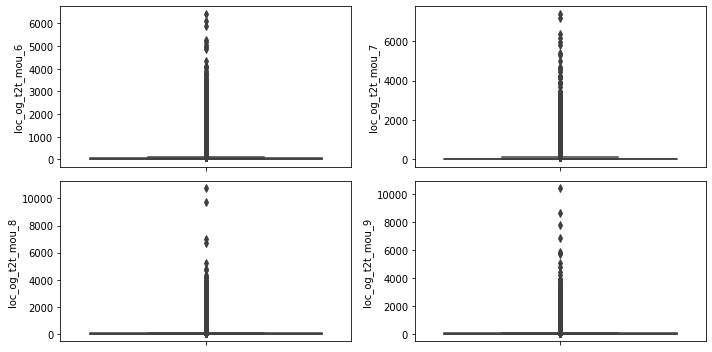

In [441]:
plt.figure(figsize=(10,5))
plt.subplot(221)
sns.boxplot(data['loc_og_t2t_mou_6'], orient='v')

plt.subplot(222)
sns.boxplot(data['loc_og_t2t_mou_7'], orient='v')

plt.subplot(223)
sns.boxplot(data['loc_og_t2t_mou_8'], orient='v')

plt.subplot(224)
sns.boxplot(data['loc_og_t2t_mou_9'], orient='v')

plt.tight_layout()

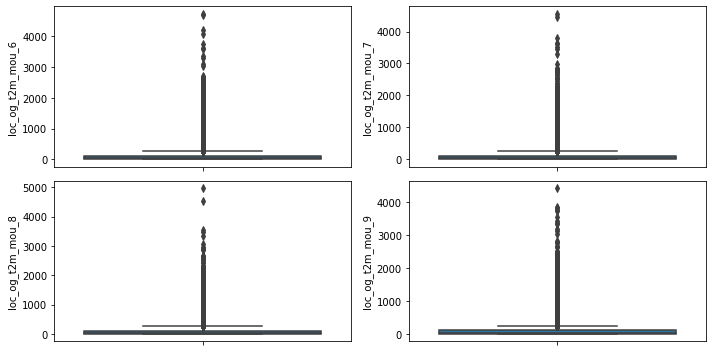

In [442]:
plt.figure(figsize=(10,5))
plt.subplot(221)
sns.boxplot(data['loc_og_t2m_mou_6'], orient='v')

plt.subplot(222)
sns.boxplot(data['loc_og_t2m_mou_7'], orient='v')

plt.subplot(223)
sns.boxplot(data['loc_og_t2m_mou_8'], orient='v')

plt.subplot(224)
sns.boxplot(data['loc_og_t2m_mou_9'], orient='v')

plt.tight_layout()

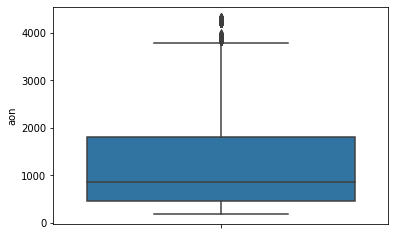

In [443]:
sns.boxplot(data['aon'], orient='v')

### Bivariate analysis

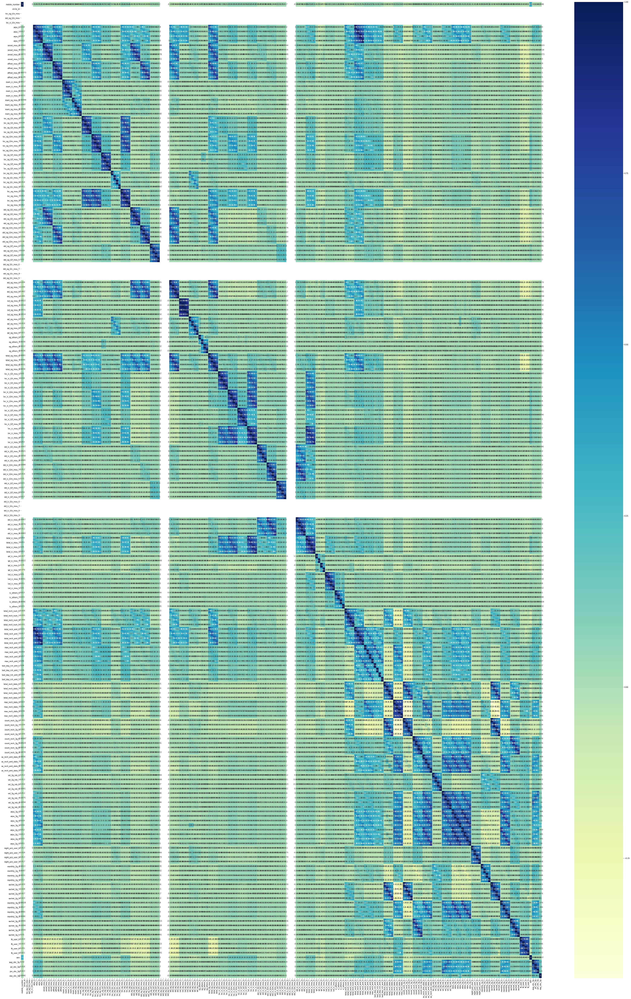

In [444]:
plt.figure(figsize = (65,100))
sns.heatmap(data.corr(), cmap ='YlGnBu', annot=True)
plt.show()

## Treating missing values

In [445]:
# checking for missing values and creating a data frame for variable and percetage of missing values
missing_values = pd.DataFrame(data.isnull().sum()/len(data['mobile_number']) *100)
missing_values = missing_values.rename(columns={0:'Missing_percentage'})
missing_values['Missing_percentage'] = round(missing_values['Missing_percentage'],2)
missing_values = missing_values.sort_values(by ='Missing_percentage', ascending = False)
missing_values

,Missing_percentage
arpu_3g_6,74.85
night_pck_user_6,74.85
total_rech_data_6,74.85
arpu_2g_6,74.85
max_rech_data_6,74.85
fb_user_6,74.85
av_rech_amt_data_6,74.85
date_of_last_rech_data_6,74.85
count_rech_2g_6,74.85
count_rech_3g_6,74.85


In [446]:
# filtering features that have more than 50% missing values
missing_values_50 = missing_values.loc[missing_values['Missing_percentage'] >=50]

In [447]:
# creating a list of features having more than 50% missing value
cols = missing_values_50.index

# dropping features having greater than 50% missing values
data.drop(cols, axis=1, inplace=True)

# imputing missing values with zero
data.fillna(0, inplace=True)

In [448]:
# checking for missing values
data.isnull().sum()/len(data.index)

mobile_number           0.0
circle_id               0.0
loc_og_t2o_mou          0.0
std_og_t2o_mou          0.0
loc_ic_t2o_mou          0.0
last_date_of_month_6    0.0
last_date_of_month_7    0.0
last_date_of_month_8    0.0
last_date_of_month_9    0.0
arpu_6                  0.0
arpu_7                  0.0
arpu_8                  0.0
arpu_9                  0.0
onnet_mou_6             0.0
onnet_mou_7             0.0
onnet_mou_8             0.0
onnet_mou_9             0.0
offnet_mou_6            0.0
offnet_mou_7            0.0
offnet_mou_8            0.0
offnet_mou_9            0.0
roam_ic_mou_6           0.0
roam_ic_mou_7           0.0
roam_ic_mou_8           0.0
roam_ic_mou_9           0.0
roam_og_mou_6           0.0
roam_og_mou_7           0.0
roam_og_mou_8           0.0
roam_og_mou_9           0.0
loc_og_t2t_mou_6        0.0
loc_og_t2t_mou_7        0.0
loc_og_t2t_mou_8        0.0
loc_og_t2t_mou_9        0.0
loc_og_t2m_mou_6        0.0
loc_og_t2m_mou_7        0.0
loc_og_t2m_mou_8    

In [449]:
# dropping date columns
data['last_date_of_month_7'].value_counts()
date_columns = ['last_date_of_month_7','last_date_of_month_8','last_date_of_month_9','last_date_of_month_6',
               'date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9']

data.drop(date_columns,axis=1, inplace=True)

In [450]:
# dropping mobile num and circle id
data.drop('mobile_number',axis=1, inplace=True)
data.drop('circle_id',axis=1, inplace=True)

In [451]:
data.shape

(99999, 176)

### Feature Engineering

In [452]:
# Derived column1: creating new column for average rechare amount of firt 2 months
data['avg_rech_amt_6-7'] = (data['total_rech_amt_6'] + data['total_rech_amt_7'])/2

In [453]:
# Derived column2 :Grouping customers based on age on network
old = data['aon'].quantile(0.75)
mid = data['aon'].quantile(0.5)
new = data['aon'].quantile(0.25)

def age_on_network(x):
    if x >= old:
        cust_grp = 'Very Old'
    elif x >= mid and x < old :
        cust_grp = 'Old'
    elif x >= new and x < mid:
        cust_grp = 'New'
    else:
        cust_grp = 'Just Joined'
    return cust_grp

data['cust_group'] = data['aon'].apply(age_on_network)
        

In [454]:
# derived column 3
data['avg_arpu_good_months'] = (data['arpu_6'] + data['arpu_7'])/2

In [455]:
#Derived Column 4: Minutes to Call Center in Good Months (numerical)   
data['mins_callcenter']=data['loc_og_t2c_mou_6']+data['loc_og_t2c_mou_7']


In [456]:
data.shape

(99999, 180)

In [457]:
data['cust_group'].value_counts()

Old            25046
New            25026
Very Old       25000
Just Joined    24927
Name: cust_group, dtype: int64

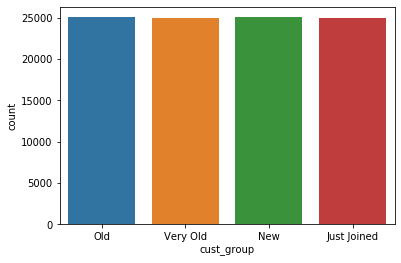

In [458]:
sns.countplot(data['cust_group'])

In [459]:
# creating dummy variables for categorical variables
dummies = pd.get_dummies(data['cust_group'], drop_first=True)

# droping column 'cust_group'
data.drop('cust_group', axis=1, inplace=True)

# concatinating dummies to original data frame
data = pd.concat([data,dummies], axis=1)

In [460]:
data.shape

(99999, 182)

### Filtering high value customers

In [461]:
# deriving 70th percentile of average recharge amount
percentile_70 = data['avg_rech_amt_6-7'].quantile(0.70)

In [462]:
# filtering data set for fetching high value customers
high_value_cus = data.loc[data['avg_rech_amt_6-7'] >percentile_70]

In [463]:
high_value_cus.shape

(29979, 182)

In [464]:
# defining churn
high_value_cus['churn'] = high_value_cus[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']].apply(
                        lambda x: 1 if ((x['total_ic_mou_9'] ==0) &(x['total_og_mou_9']==0) & (x['vol_2g_mb_9']==0)
                        & (x['vol_3g_mb_9']==0)) else 0, axis=1)

In [465]:
high_value_cus.shape

(29979, 183)

In [466]:
# droping all features corresponding to 9th month
#Get all the columns ending with 9. All the columns of month 9
month_9_cols = [col for col in high_value_cus.columns if '9' in col]
month_9_cols
print(len(month_9_cols))

42


In [467]:
# dropping features corresponding to month 9 from the high value customers data set
high_value_cus.drop(month_9_cols, axis = 1, inplace=True)

high_value_cus.shape

(29979, 141)

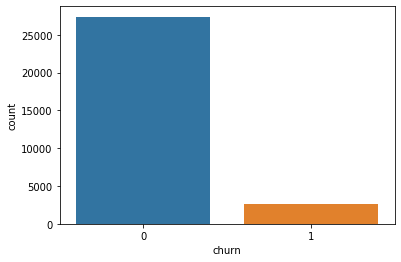

In [468]:
# plotting churn 
sns.countplot(high_value_cus['churn'])
plt.show()

From the above plot we can observe that their is an issue of class imbalance. 
This should be dealth during the modeling phase.

In [469]:
# Deriving churn rate
churn_rate = high_value_cus['churn'].sum() / len(high_value_cus.index)
churn_rate

0.08636045231662164

###  Train Test split


In [470]:
# train test split
X = high_value_cus.drop('churn',axis = 1)

y = high_value_cus['churn']

X_train,X_test,y_train,y_test = train_test_split(X,y, test_size =0.30, random_state=100)

In [471]:
X_train.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_amt_6-7,avg_arpu_good_months,mins_callcenter,New,Old,Very Old
88105,0.0,0.0,0.0,0.000,653.967,985.600,0.00,52.63,53.04,0.00,1319.53,2317.81,0.00,0.0,0.0,0.00,0.0,0.0,0.00,38.54,37.34,0.00,16.69,37.78,0.00,0.00,0.00,0.0,5.20,0.25,0.00,55.24,75.13,0.00,14.08,15.69,0.00,1297.63,2274.16,0.0,0.0,0.0,0.0,0.0,0.0,0.00,1311.71,2289.86,0.0,0.0,0.0,0.00,5.20,5.86,0.0,0.0,0.0,0.00,1372.16,2370.86,0.00,1.66,11.09,0.00,30.29,55.19,0.00,8.84,11.09,0.00,40.81,77.39,0.00,1.89,0.00,0.00,15.89,24.33,0.00,0.00,0.00,0.0,0.0,0.0,0.00,17.79,24.33,0.00,58.61,101.73,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,31,23,0,786,1194,0,110,130,0,10,130,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,1078,0.00,0.00,0.00,0.00,393.0,326.9835,5.20,0,1,0
34588,0.0,0.0,0.0,343.639,516.521,160.704,46.49,37.59,17.11,94.78,97.38,94.44,0.00,0.0,0.0,0.00,0.0,0.0,31.74,35.38,14.64,90.01,91.83,91.86,4.76,5.54,2.36,0.0,0.00,0.00,126.53,132.76,108.88,14.74,2.21,2.46,0.00,0.00,0.21,0.0,0.0,0.0,0.0,0.0,0.0,14.74,2.21,2.68,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,141.28,134.98,111.56,19.51,15.69,3.44,69.14,43.19,59.51,14.64,14.79,0.88,103.31,73.69,63.84,6.64,1.06,4.96,1.66,0.00,0.33,0.00,0.00,0.00,0.0,0.0,0.0,8.31,1.06,5.29,111.63,76.23,69.14,0.00,0.0,0.0,0.00,1.46,0.00,0.00,0.00,0.00,9,13,7,399,570,210,252,252,50,7,23,50,184.86,80.42,7.53,41.15,2395.55,461.95,0,1,1,0,0,0,1,1,0,0,0,0,999,137.59,2055.83,38.36,2.45,484.5,430.0800,0.00,0,1,0
16623,0.0,0.0,0.0,898.590,498.275,518.409,83.06,26.39,11.86,452.59,476.04,219.49,0.00,0.0,0.0,0.00,0.0,0.0,82.48,26.39,11.86,399.06,419.61,204.96,31.69,35.03,9.89,0.0,0.00,0.00,513.24,481.04,226.73,0.58,0.00,0.00,0.00,3.09,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.58,3.09,0.00,0.0,0.0,0.0,23.51,18.63,4.63,0.0,0.0,0.0,537.34,502.78,231.36,27.46,39.39,13.78,147.43,205.48,170.49,50.93,56.83,53.04,225.83,301.71,237.33,0.00,1.45,0.00,0.80,2.69,0.63,0.38,0.71,3.16,0.0,0.0,0.0,1.18,4.86,3.79,296.03,335.11,242.68,0.00,0.0,0.0,69.01,28.43,1.19,0.00,0.09,0.35,14,4,12,1124,437,938,250,250,289,0,0,0,30.04,73.91,106.02,1184.24,872.99,1311.85,2,1,1,0,

### Feature scaling

In [472]:
cols = X_train.columns

In [473]:
# instantiating the scaler objecting
scaler = MinMaxScaler()
# scaling training data
X_train[cols] = scaler.fit_transform(X_train[cols])
# scaling test data
X_test[cols] = scaler.fit_transform(X_test[cols])

### PCA for dimensionality reduction

In [474]:
pca = PCA(svd_solver='randomized',random_state=42)

pca.fit(X_train[cols])

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='randomized', tol=0.0, whiten=False)

In [475]:
pca_df = pca.transform(X_train[cols])

In [476]:
pca.components_

array([[ 9.20111827e-17,  0.00000000e+00,  5.55111512e-17, ...,
        -4.31817478e-01, -2.48642425e-01,  7.77811781e-01],
       [-3.93099413e-17,  1.66533454e-16, -1.11022302e-16, ...,
        -6.17873346e-01,  7.73726197e-01, -1.25582412e-01],
       [ 1.97854018e-20, -3.07154475e-16,  2.20960403e-16, ...,
        -6.51603321e-01, -5.42816034e-01, -3.34495656e-01],
       ...,
       [-0.00000000e+00,  1.63685910e-02,  5.30761364e-01, ...,
        -2.22044605e-16,  1.66533454e-16,  6.93889390e-17],
       [ 0.00000000e+00,  3.94411520e-01, -1.22134752e-01, ...,
         6.93889390e-18, -5.55111512e-17, -3.33066907e-16],
       [-1.00000000e+00, -2.66650971e-22,  1.05902351e-22, ...,
        -3.65130216e-17, -8.76891956e-17,  1.73375049e-17]])

In [477]:
features = X_train[cols].columns
pca_df = pd.DataFrame({'PC1': pca.components_[0],'PC2':pca.components_[1],'features':features})
pca_df

,PC1,PC2,features
0,9.201118e-17,-3.930994e-17,loc_og_t2o_mou
1,0.000000e+00,1.665335e-16,std_og_t2o_mou
2,5.551115e-17,-1.110223e-16,loc_ic_t2o_mou
3,-3.160467e-04,-5.548961e-05,arpu_6
4,-5.579128e-04,-1.853452e-04,arpu_7
5,5.023500e-04,1.341284e-04,arpu_8
6,-1.328235e-02,-1.785559e-03,onnet_mou_6
7,-1.254628e-02,-3.118784e-03,onnet_mou_7
8,-6.827940e-03,-1.182258e-03,onnet_mou_8
9,-7.118602e-03,-2.742957e-03,offnet_mou_6


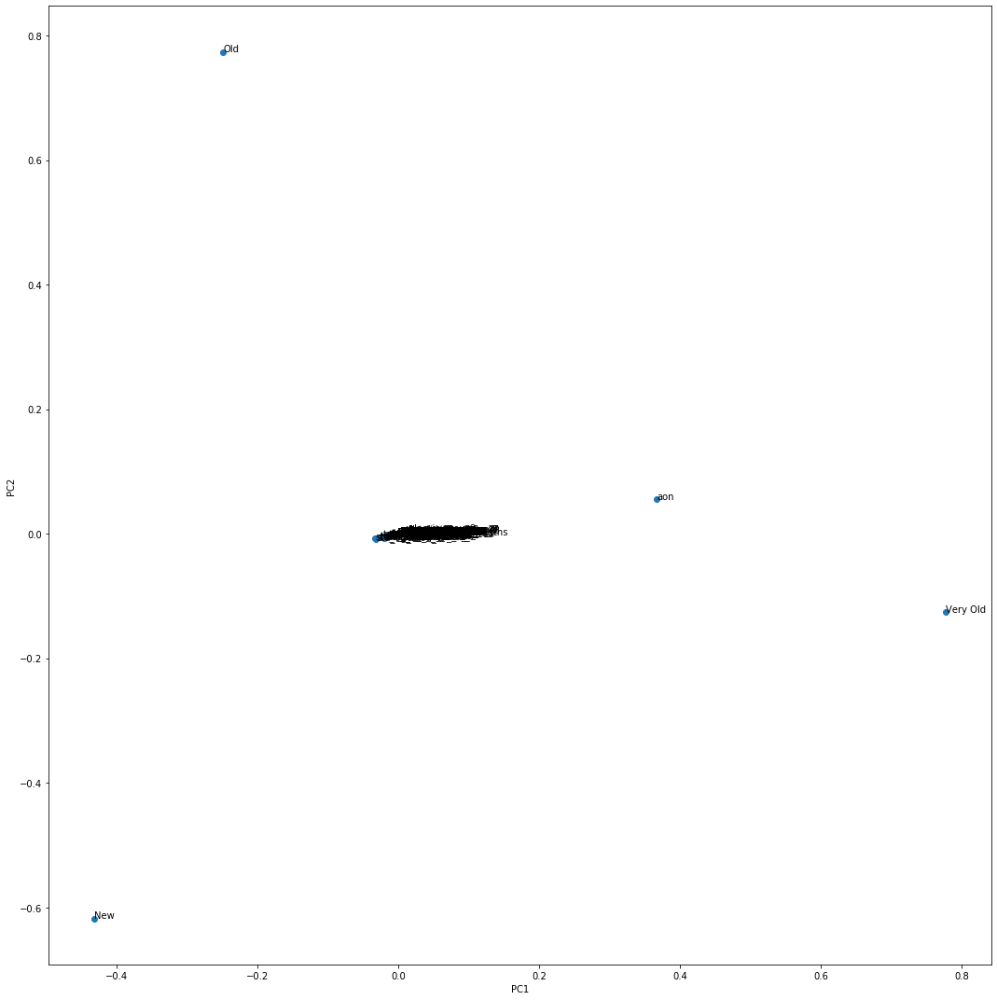

In [478]:
# plotting the principal componets
fig = plt.figure(figsize = (15,15))

plt.scatter(pca_df.PC1,pca_df.PC2)
plt.xlabel('PC1')
plt.ylabel('PC2')

for i, txt in enumerate(pca_df.features):
    plt.annotate(txt,(pca_df.PC1[i],pca_df.PC2[i]))
plt.tight_layout()
plt.show()

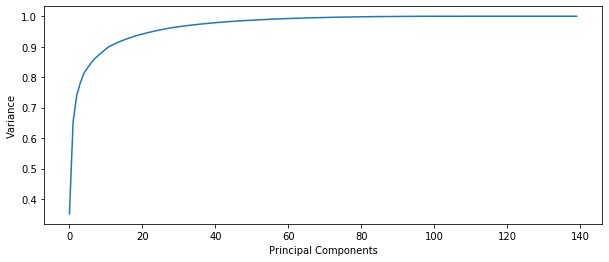

In [479]:
# plotting the scree plot
plt.figure(figsize=(10,4))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Variance')
plt.show()

From the above scree plot, the optimal number of principal components can be 30 to achieve around 95% variance.

In [480]:
# PCA with 30 components
pca_final = IncrementalPCA(n_components=30)

X_train_pca = pca_final.fit_transform(X_train[cols])

In [481]:
X_train_pca.shape

(20985, 30)

In [482]:
# applying selected components to test data
X_test_pca = pca_final.transform(X_test[cols])
X_test_pca.shape

(8994, 30)

In [483]:
# creating a data frame for features, their explained variance ratio and filtering 40 features selected by PCA
pca_features = X_test[cols].columns
features_selected = pd.DataFrame(pca.explained_variance_ratio_,pca_features)
features_selected = pca_explained_variance_ratio.rename(columns={0:'explained variance'})
features_selected['explained variance'] = round(pca_explained_variance_ratio['explained variance'],3)
features_selected = pca_explained_variance_ratio.ix[0:30,:]
features_selected

,explained variance,Logistic_reg_coefficients
loc_og_t2o_mou,0.351,-0.79132
std_og_t2o_mou,0.301,-0.20507
loc_ic_t2o_mou,0.089,-1.21074
arpu_6,0.041,-0.37580
arpu_7,0.032,-7.00782
arpu_8,0.017,-2.04487
onnet_mou_6,0.017,1.37570
onnet_mou_7,0.013,-6.04926
onnet_mou_8,0.011,4.15925
offnet_mou_6,0.010,-6.18050


## Logistic Regression for results through PCA

In [484]:
# instantiating a logistic regression object and setting class weight as balanced to handle class imbalance
lr = LogisticRegression(class_weight='balanced')
lr.fit(X_train_pca,y_train)

LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [485]:
# deriving probabilities for training data
train_probs = lr.predict_proba(X_train_pca)
train_probs

array([[0.94235466, 0.05764534],
       [0.75283732, 0.24716268],
       [0.9551369 , 0.0448631 ],
       ...,
       [0.94705438, 0.05294562],
       [0.56712632, 0.43287368],
       [0.78454387, 0.21545613]])

In [486]:
# predicting probabilities for test data
test_probs = lr.predict_proba(X_test_pca)[:,1]
test_probs

array([0.01334806, 0.22691812, 0.23153427, ..., 0.54920131, 0.0129569 ,
       0.28824028])

In [487]:
# creating data frame for the predicted probabilities
y_test_pred = pd.DataFrame(test_probs)
y_test_pred.head()

,0
0,0.013348
1,0.226918
2,0.231534
3,0.544184
4,0.927013


In [488]:
# creating data frame of actual churn values
y_test_df = pd.DataFrame(y_test)
y_test_df.head()

,churn
76438,0
72869,0
86053,0
29093,0
96385,0


In [489]:
# dropping index
y_test_pred.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [490]:
# concatinating y_test_pred and y_test_df
y_pred_final = pd.concat([y_test_df,y_test_pred], axis=1)
y_pred_final.head()

,churn,0
0,0,0.013348
1,0,0.226918
2,0,0.231534
3,0,0.544184
4,0,0.927013


In [491]:
# renaming the column names
y_pred_final = y_pred_final.rename(columns = {0:'churn_prob'})
y_pred_final.head()

,churn,churn_prob
0,0,0.013348
1,0,0.226918
2,0,0.231534
3,0,0.544184
4,0,0.927013


In [492]:
# setting probability to 0.5 to detect churn
y_pred_final['predicted'] = y_pred_final.churn_prob.map( lambda x: 1 if x > 0.5 else 0)
y_pred_final.head()

,churn,churn_prob,predicted
0,0,0.013348,0
1,0,0.226918,0
2,0,0.231534,0
3,0,0.544184,1
4,0,0.927013,1


In [493]:
# creating confusion matrix
confusion = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.predicted)
confusion

array([[5872, 2307],
       [ 105,  710]])

In [494]:
# Metrics beyond simple accuracy
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [495]:
# sensitivity and Specificity
sensitivity = round(TP/float(TP+FN),3)
print("sensitivity",sensitivity)
Specificity = round(TN/float(TN+FP),3)
print("specificity",Specificity)

sensitivity 0.871
specificity 0.718


In [496]:
# accuracy
accuracy = metrics.accuracy_score(y_pred_final.churn,y_pred_final.predicted)
accuracy

0.7318212141427618

In [497]:
# recall score
recall_score(y_pred_final.churn,y_pred_final.predicted)

0.8711656441717791

In [498]:
# precision
precision_score(y_pred_final.churn,y_pred_final.predicted)

0.23533311236327478

In [499]:
#Applying selected components to the test data - 58 components
X_test_pca = pca_final.transform(X_test[cols])
X_test_pca.shape

(8994, 30)

In [500]:
# function for ROC curve
from sklearn import metrics
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [501]:
fpr, tpr, thresholds = metrics.roc_curve( y_pred_final.churn, y_pred_final.churn_prob, 
                                        drop_intermediate = False )

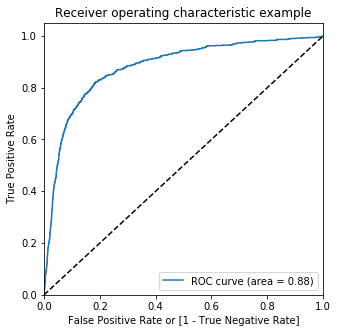

In [502]:
draw_roc(y_pred_final.churn, y_pred_final.churn_prob)

In [503]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final[i]= y_pred_final.churn_prob.map( lambda x: 1 if x > i else 0)
y_pred_final.head()

,churn,churn_prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.013348,0,1,0,0,0,0,0,0,0,0,0
1,0,0.226918,0,1,1,1,0,0,0,0,0,0,0
2,0,0.231534,0,1,1,1,0,0,0,0,0,0,0
3,0,0.544184,1,1,1,1,1,1,1,0,0,0,0
4,0,0.927013,1,1,1,1,1,1,1,1,1,1,1


In [504]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix( y_pred_final.churn, y_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    sensi = cm1[1,1]/(cm1[1,1]+cm1[1,0])
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.090616  1.000000  0.000000
0.1   0.1  0.244496  0.982822  0.170926
0.2   0.2  0.374694  0.969325  0.315442
0.3   0.3  0.504003  0.947239  0.459836
0.4   0.4  0.628419  0.912883  0.600073
0.5   0.5  0.731821  0.871166  0.717936
0.6   0.6  0.816433  0.818405  0.816237
0.7   0.7  0.870136  0.725153  0.884582
0.8   0.8  0.904492  0.604908  0.934344
0.9   0.9  0.912720  0.309202  0.972857


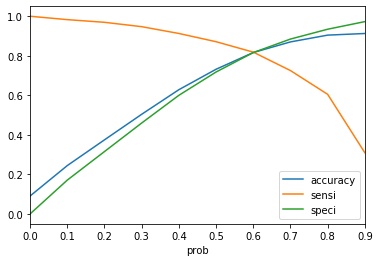

In [505]:
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])

In [506]:
# setting optimal threshold probability to 0.6
y_pred_final['predicted'] = y_pred_final.churn_prob.map(lambda x: 1 if x>0.6 else 0)

In [507]:
accuracy = metrics.accuracy_score(y_pred_final.churn, y_pred_final.predicted)
print("accuracy : ", accuracy)
recall = recall_score(y_pred_final.churn,y_pred_final.predicted)
print("recall : ",recall)

accuracy :  0.8164331776740049
recall :  0.8184049079754602


From the cutoff_df data we can see that for the threshold value of 0.5 the sensitivity/Recall is 87% and accuracy is 73%.  Since the business aims at correctly identifying customer who would churn, we can focus on having high sensitivity/Recall score by allowing accuracy to marginally take a dip.

Therefore setting the optimal threshold as 0.5 to attain 87% recall score and 73% accuracy

In [508]:
# setting optimal threshold probability to 0.6
y_pred_final['predicted'] = y_pred_final.churn_prob.map(lambda x: 1 if x>0.5 else 0)

In [509]:
print(classification_report(y_pred_final['churn'],y_pred_final['predicted']))

              precision    recall  f1-score   support

           0       0.98      0.72      0.83      8179
           1       0.24      0.87      0.37       815

    accuracy                           0.73      8994
   macro avg       0.61      0.79      0.60      8994
weighted avg       0.91      0.73      0.79      8994



In [510]:
# mapping coefficients of logistics to the selected features
#pca_explained_variance_ratio['Logistic_reg_coefficients'] = 
coeffs = np.reshape(np.round(lr.coef_,5),(-1,1))
features_selected['Logistic_reg_coefficients'] = coeffs
features_selected = features_selected.sort_values(by='Logistic_reg_coefficients', ascending=False)
features_selected

,explained variance,Logistic_reg_coefficients
loc_og_t2t_mou_7,0.004,13.50080
loc_og_t2m_mou_7,0.003,6.89783
loc_og_t2t_mou_6,0.004,5.96436
onnet_mou_8,0.011,4.15925
roam_og_mou_8,0.004,4.13292
offnet_mou_8,0.009,3.94531
loc_og_t2m_mou_6,0.003,3.17826
loc_og_t2f_mou_6,0.003,1.67902
roam_ic_mou_8,0.005,1.62523
onnet_mou_6,0.017,1.37570


## Decision Tree for results throgh PCA

In [511]:
# Building decision tree with default hyper parameters
# setting class_weight='balanced' to handle class imbalance
dt_default = DecisionTreeClassifier(class_weight='balanced')
dt_default.fit(X_train_pca,y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [512]:
# Making prediction on test data
predicted = dt_default.predict(X_test_pca)
predicted

array([0, 0, 0, ..., 0, 0, 0])

In [513]:
# classification report
print(classification_report(y_test,predicted))

              precision    recall  f1-score   support

           0       0.93      0.91      0.92      8179
           1       0.26      0.31      0.28       815

    accuracy                           0.86      8994
   macro avg       0.60      0.61      0.60      8994
weighted avg       0.87      0.86      0.86      8994



In [514]:
recall_score(y_test, predicted)

0.3079754601226994

In [515]:
accuracy_score(y_test,predicted)

0.8584611963531243

## Tuning hyper parameters

### Tuning max_depth

In [516]:
# GridSearchCV to find optimal max_depth

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100, class_weight='balanced')

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
tree.fit(X_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None, param_grid={'max_depth': range(1, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             sco

In [517]:
# scores of GridSearch CV
scores = tree.cv_results_
scores_data =pd.DataFrame(scores).head()
scores_data.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.076406,0.011964,0.001263,0.000142,1,{'max_depth': 1},0.650071,0.662854,0.665952,0.657374,0.671592,0.661568,0.007364,18,0.661703,0.656421,0.658506,0.657791,0.682352,0.663355,0.009655
1,0.126288,0.001232,0.001287,0.000050,2,{'max_depth': 2},0.497380,0.730998,0.641649,0.661425,0.570543,0.620396,0.079987,19,0.494430,0.738444,0.648499,0.673398,0.574900,0.625934,0.084045
2,0.183397,0.003011,0.001299,0.000043,3,{'max_depth': 3},0.742258,0.777698,0.741005,0.766976,0.749523,0.755492,0.014461,17,0.742658,0.782047,0.743329,0.776567,0.754184,0.759757,0.016569
3,0.234543,0.002117,0.001377,0.000114,4,{'max_depth': 4},0.779181,0.768644,0.760782,0.724327,0.745710,0.755730,0.019125,16,0.792697,0.784072,0.757624,0.740112,0.751206,0.765142,0.019974
4,0.283473,0.002139,0.001304,0.000091,5,{'max_depth': 5},0.748928,0.807482,0.773886,0.744103,0.756911,0.766262,0.022961,15,0.768750,0.825292,0.780677,0.761615,0.774138,0.782094,0.022489


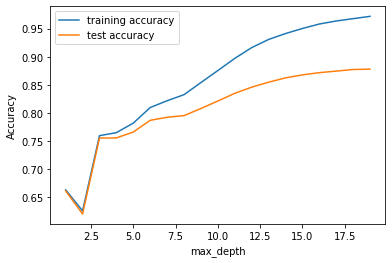

In [518]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

From the above plot, we can see that the model is overfitting if max depth is too high. The optimal value for max depth can be 15 to achieve 85% accuracy

### Tuning min_sample_leaf

In [519]:
# specify number of folds
n_folds = 5

# parameters to build model on
parameters = {'min_samples_leaf': range(10,300,20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion='gini',random_state=100, class_weight='balanced')

# fit the tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
tree.fit(X_train_pca, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_leaf': range(10, 300, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sc

In [520]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.526608,0.040099,0.001606,0.000112,10,{'min_samples_leaf': 10},0.819438,0.814391,0.820586,0.805099,0.821020,0.816107,0.005990,1,0.885745,0.882118,0.886705,0.878663,0.890345,0.884715,0.004002
1,0.459949,0.020101,0.001548,0.000035,30,{'min_samples_leaf': 30},0.785850,0.778890,0.793662,0.780081,0.775977,0.782893,0.006269,2,0.829094,0.820884,0.825768,0.826364,0.820359,0.824494,0.003359
2,0.440004,0.019106,0.001507,0.000080,50,{'min_samples_leaf': 50},0.762030,0.777222,0.787229,0.759590,0.767636,0.770741,0.010235,3,0.803241,0.807005,0.807124,0.791101,0.805110,0.802716,0.005979
3,0.423016,0.021124,0.001533,0.000059,70,{'min_samples_leaf': 70},0.742496,0.775077,0.788897,0.750774,0.768589,0.765166,0.016699,4,0.779710,0.804861,0.797951,0.780141,0.802430,0.793019,0.010919
4,0.408292,0.016706,0.001486,0.000022,90,{'min_samples_leaf': 90},0.745593,0.773410,0.769836,0.771503,0.747855,0.761639,0.012252,5,0.776792,0.800334,0.772873,0.795807,0.772470,0.783655,0.011952


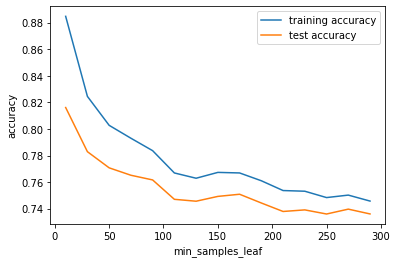

In [521]:
# plotting accuracies with min_sample_leaf

plt.figure()
plt.plot(scores["param_min_samples_leaf"],
        scores["mean_train_score"],
        label= "training accuracy")
plt.plot(scores["param_min_samples_leaf"],
        scores["mean_test_score"],
        label ="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("accuracy")
plt.legend()

The models tends to overfit at lower values of min_samples_leaf.

### Tuning min_samples_split

In [522]:
# specify number of folds
n_folds = 5

# parameter to tune
parameters = {'min_samples_split': range(100,500,50)}

# instantiate the tree model
dtree = DecisionTreeClassifier(class_weight='balanced', criterion='gini', random_state=100)

# fit the tree on training data
tree = GridSearchCV(dtree, parameters, cv=n_folds, return_train_score=True, scoring="accuracy")

tree.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_split': range(100, 500, 50)},
             pre_dispatch='2*n_jobs', refit=True, return_train_

In [523]:
# scores of GridSearch CV
scores=tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.536839,0.036808,0.001555,0.000070,100,{'min_samples_split': 100},0.776084,0.784370,0.793186,0.761496,0.787178,0.780462,0.010965,1,0.824567,0.830772,0.826960,0.811472,0.836798,0.826114,0.008406
1,0.512677,0.030971,0.001503,0.000017,150,{'min_samples_split': 150},0.767508,0.776030,0.771503,0.756969,0.776215,0.769645,0.007108,2,0.811580,0.811949,0.786931,0.796343,0.813092,0.803979,0.010519
2,0.556810,0.124573,0.001832,0.000720,200,{'min_samples_split': 200},0.744164,0.763641,0.755301,0.760067,0.766444,0.757922,0.007824,3,0.787872,0.795926,0.764951,0.795985,0.798201,0.788587,0.012330
3,0.756031,0.183898,0.004310,0.003480,250,{'min_samples_split': 250},0.715102,0.756969,0.770550,0.734096,0.779790,0.751299,0.023752,4,0.754751,0.788480,0.781808,0.765368,0.811186,0.780319,0.019488
4,0.814918,0.093788,0.002276,0.001375,300,{'min_samples_split': 300},0.709385,0.750774,0.769597,0.736955,0.771449,0.747629,0.022964,6,0.747602,0.778771,0.778949,0.766500,0.803145,0.774993,0.018137


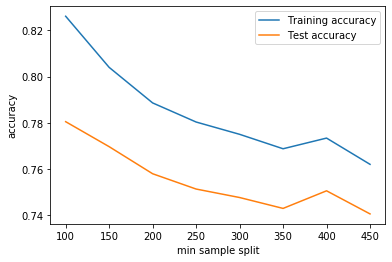

In [524]:
# plotting accuracies with min_samples_split

plt.figure()
plt.plot(scores['param_min_samples_split'],
        scores['mean_train_score'],
        label = "Training accuracy")
plt.plot(scores['param_min_samples_split'],
        scores['mean_test_score'], 
        label = "Test accuracy")
plt.xlabel("min sample split")
plt.ylabel("accuracy")
plt.legend()
plt.show()

Accuracy is high for lower values of min_samples_split

In [525]:
# building the tree best hyper parameters
par_grid = {'max_dept':15, 
           'min_samples_leaf': 250,
           'min_samples_split': 100}

# specify number of folds
n_folds = 5

# instantiate the tree
dtree = DecisionTreeClassifier(class_weight='balanced', max_depth=12, min_samples_leaf=250,
                              min_samples_split=350)


dtree.fit(X_train_pca,y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=12,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=250, min_samples_split=350,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [526]:
# accuracy score on training data
dtree.score(X_train_pca,y_train)

0.7578270192994997

In [527]:
# making prediction test data
y_tree_pred = dtree.predict(X_test_pca)

In [528]:
dtree.score(X_test_pca,y_test)

0.6900155659328441

In [529]:
print(classification_report(y_test,y_tree_pred))

              precision    recall  f1-score   support

           0       0.96      0.69      0.80      8179
           1       0.19      0.73      0.30       815

    accuracy                           0.69      8994
   macro avg       0.57      0.71      0.55      8994
weighted avg       0.89      0.69      0.76      8994



## Random Forest for results through PCA

In [530]:
# Building Random forest with default hyper parameters
# setting class weight as balanced to handle class imbalance probles
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(X_train_pca,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [531]:
# making predictions on the test data
prediction = rfc.predict(X_test_pca)

In [532]:
# classification report
print(classification_report(y_test,prediction))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95      8179
           1       0.57      0.12      0.20       815

    accuracy                           0.91      8994
   macro avg       0.75      0.56      0.58      8994
weighted avg       0.89      0.91      0.89      8994



### Tuning hyperparameters

In [533]:
# Tuning max depth
parameters = {'max_depth': range(2,20,2)}

# number of folds
n_folds = 5

# instantiate the random forest object 
rfc = RandomForestClassifier(class_weight='balanced')

# grid search
forest = GridSearchCV(rfc, parameters, cv=n_folds, scoring="accuracy", return_train_score=True)

# fitting the model
forest.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [534]:
# Grid search results
scores = forest.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.175577,0.011099,0.005714,0.000959,2,{'max_depth': 2},0.769652,0.784608,0.720276,0.767215,0.776692,0.763688,0.022536,9,0.783166,0.789314,0.731296,0.773946,0.767824,0.769109,0.020301
1,0.304789,0.027242,0.005399,0.000448,4,{'max_depth': 4},0.831110,0.819395,0.814391,0.823922,0.829123,0.823588,0.006156,8,0.846786,0.825173,0.824279,0.830474,0.829412,0.831225,0.008135
2,0.470915,0.086597,0.007888,0.002856,6,{'max_depth': 6},0.851834,0.851799,0.853228,0.853228,0.852240,0.852466,0.000642,7,0.871925,0.871396,0.862580,0.871158,0.865626,0.868537,0.003754
3,0.524633,0.068773,0.007568,0.001547,8,{'max_depth': 8},0.865412,0.874672,0.880391,0.878246,0.886797,0.877103,0.007052,6,0.901471,0.901060,0.900167,0.898678,0.906963,0.901668,0.002816
4,0.523538,0.008561,0.007432,0.000840,10,{'max_depth': 10},0.889471,0.894687,0.894687,0.894687,0.904194,0.895544,0.004773,5,0.935188,0.934715,0.928103,0.928520,0.934719,0.932249,0.003222


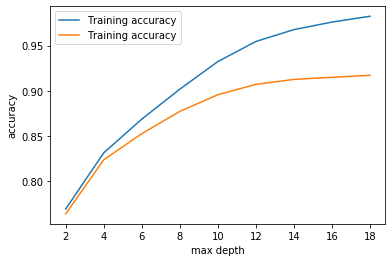

In [535]:
# plotting accuracies with max_depth

plt.plot(scores['param_max_depth'], scores['mean_train_score'], label = "Training accuracy")
plt.plot(scores['param_max_depth'], scores['mean_test_score'], label = "Training accuracy")
plt.xlabel("max depth")
plt.ylabel("accuracy")
plt.legend()


In [536]:
# Tuning n_estimators
parameters = {'n_estimators': range(1,10,2)}
# number of folds
n_folds = 5

# instantiate the random forest object 
rfc = RandomForestClassifier(class_weight='balanced')
# Grid search
forest = GridSearchCV(rfc, parameters, cv=n_folds, scoring="accuracy", return_train_score=True)
# fitting the model
forest.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [537]:
# Grid search results
scores = forest.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.074175,0.010937,0.002259,0.000156,1,{'n_estimators': 1},0.882801,0.881820,0.880152,0.886347,0.895853,0.885394,0.005608,5,0.957110,0.955504,0.957767,0.956278,0.958961,0.957124,0.001194
1,0.191603,0.004079,0.003288,0.000159,3,{'n_estimators': 3},0.909004,0.908744,0.913510,0.909459,0.913727,0.910889,0.002241,4,0.980699,0.980403,0.980939,0.980879,0.981238,0.980832,0.000276
2,0.310806,0.003212,0.004531,0.000116,5,{'n_estimators': 5},0.909957,0.913271,0.918275,0.909459,0.918017,0.913796,0.003787,3,0.988801,0.987134,0.987670,0.987789,0.986122,0.987503,0.000876
3,0.430283,0.009521,0.005883,0.000185,7,{'n_estimators': 7},0.910910,0.916845,0.918037,0.915654,0.917541,0.915797,0.002572,2,0.990350,0.991720,0.990589,0.990172,0.991423,0.990851,0.000611
4,0.553087,0.007881,0.007198,0.000089,9,{'n_estimators': 9},0.917580,0.917560,0.920181,0.914463,0.917064,0.917370,0.001818,1,0.992911,0.993448,0.993388,0.992435,0.992257,0.992888,0.000483


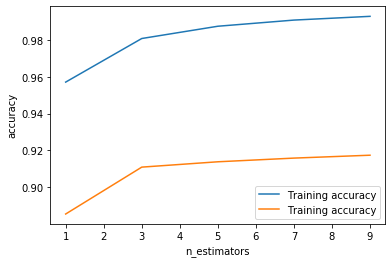

In [538]:
# plotting accuracies with n_estimators
plt.plot(scores['param_n_estimators'], scores['mean_train_score'], label = "Training accuracy")
plt.plot(scores['param_n_estimators'], scores['mean_test_score'], label = "Training accuracy")
plt.xlabel("n_estimators")
plt.ylabel("accuracy")
plt.legend()

In [539]:
# Tuning max features
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [10,20,30]} 

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')

# grid search
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                  return_train_score=True)

# fitting the model
rf.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [540]:
# grid search results
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.181568,0.007489,0.007853,0.000207,10,{'max_features': 10},0.915912,0.918513,0.920658,0.919466,0.919685,0.918847,0.001618,3,0.990231,0.990350,0.991065,0.990052,0.989457,0.990231,0.000518
1,2.302937,0.055208,0.007732,0.000178,20,{'max_features': 20},0.916627,0.919466,0.922802,0.918751,0.919447,0.919419,0.001984,1,0.989814,0.988623,0.991482,0.991303,0.989993,0.990243,0.001052
2,3.443507,0.064808,0.007771,0.000108,30,{'max_features': 30},0.916865,0.918513,0.919705,0.921134,0.920400,0.919323,0.001502,2,0.989277,0.989993,0.990589,0.990231,0.988862,0.989790,0.000632


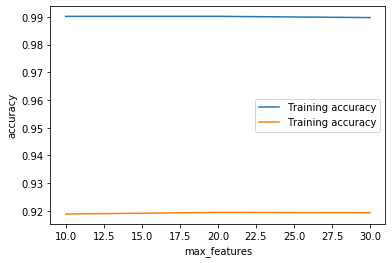

In [541]:
# plotting accuracies with max_features
plt.plot(scores['param_max_features'], scores['mean_train_score'], label = "Training accuracy")
plt.plot(scores['param_max_features'], scores['mean_test_score'], label = "Training accuracy")
plt.xlabel("max_features")
plt.ylabel("accuracy")
plt.legend()

In [542]:
# building random forest with best hyper parameters

# instantiate the object
rfc = RandomForestClassifier(class_weight='balanced', max_depth=4,n_estimators=3,max_features=10)

# fit the model
rfc.fit(X_train_pca,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=4, max_features=10,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=3, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [543]:
# make prediction on test data
prediction = forest.predict(X_test_pca)

In [544]:
# classification report
print(classification_report(prediction,y_test))

              precision    recall  f1-score   support

           0       0.99      0.92      0.95      8727
           1       0.18      0.56      0.28       267

    accuracy                           0.91      8994
   macro avg       0.58      0.74      0.62      8994
weighted avg       0.96      0.91      0.93      8994



### Evaluating the models

| Model | Accuracy | Recall |
| --- | --- | --- |
| Logistic Regression | 0.73 | 0.87 |
| Decision Tree | 0.69 | 0.73 |
| Random Forest | 0.91 | 0.56 |

From the table above we can see that logistic regression provides 87% chances of correctly identifying churn customers. Hence the appropriate model for the business problem is logistic regression.

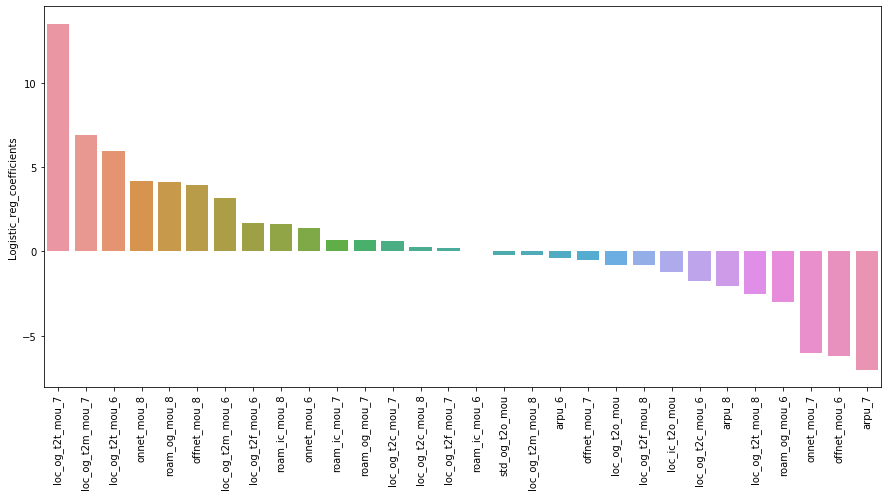

In [545]:
plt.figure(figsize = (15,7))
sns.barplot(x=features_selected.index, y=features_selected.Logistic_reg_coefficients)
plt.xticks(rotation=90)
plt.show()

## Top 10 important features and their respective coefficients


In [546]:
features_selected.head(10)

,explained variance,Logistic_reg_coefficients
loc_og_t2t_mou_7,0.004,13.50080
loc_og_t2m_mou_7,0.003,6.89783
loc_og_t2t_mou_6,0.004,5.96436
onnet_mou_8,0.011,4.15925
roam_og_mou_8,0.004,4.13292
offnet_mou_8,0.009,3.94531
loc_og_t2m_mou_6,0.003,3.17826
loc_og_t2f_mou_6,0.003,1.67902
roam_ic_mou_8,0.005,1.62523
onnet_mou_6,0.017,1.37570


The above table shows the top 10 driving features.

## Summary and recomendations

1. Monitor minutes of usage for offnet calls in mounth 7.
2. Monitor local incoming minutes of usage for operator to other operator on fixed line
3. Monitor average revenue per user in the 6th month.
4. Monitor roaming incoming on month 8 and provide good offers if there is a decrease in minutes of usage.
5. Provide good offers on local out going in month 8.
6. Provide good offers on roaming out going in month 7.
7. Monitor average revenue in month 8 and if there is a decrease in revenue, provide customers with good offers.